# [IAPR][iapr]: Final project - Chocolate Recognition


**Moodle group ID:** *xx*  
**Kaggle challenge:** *xx* (either `Classic` or `Deep learning`)  
**Kaggle team name (exact):** "*xx*"  

**Author 1 (SCIPER):** *Student Name 1 (xxxxx)*  
**Author 2 (SCIPER):** *Student Name 2 (xxxxx)*  
**Author 3 (SCIPER):** *Student Name 3 (xxxxx)*  

**Due date:** 21.05.2025 (11:59 pm)


## Key Submission Guidelines:
- **Before submitting your notebook, <span style="color:red;">rerun</span> it from scratch!** Go to: `Kernel` > `Restart & Run All`
- **Only groups of three will be accepted**, except in exceptional circumstances.


[iapr]: https://github.com/LTS5/iapr2025

---

> Your comments  
> ...

## 1. Imports and Setup

In [1]:
import os
import pandas as pd
import random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.optim as optim
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import DataLoader, Subset
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from IPython.display import Image

# Import custom modules
from src.dataset import ChocolateTestDataset, AugmentedChocolateSegmentationDataset, AugmentedChocolateBinarySegmentationDataset, get_segmentation_transforms
from src.dataset import create_aligned_training_data, ChocolateFeatureDataset, get_robust_feature_transforms
from src.utils import inverse_transform, visualize_pipeline_results, visualize_segmentation_sample, visualize_binary_samples, get_binary_seg_backgrounds
from src.utils import process_and_visualize_with_watershed, visualize_aligned_dataset, visualize_feature_extractor_batch
from src.utils import show_background_distribution, visualize_predictions, separate_chocolates_watershed
from src.model import AttentionUNet, FeatureExtractor
from src.loss import BCEDiceLoss, LabelSmoothingLoss
from src.pipeline import chocolate_detection_pipeline, run_test_inference, convert_to_submission_format, save_submission_file
from src.pipeline import extract_chocolate_regions_improved
from src.training import train_segmentation_model, train_feature_model

# Set device for PyTorch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


## 2. Data Loading and Preparation for First model (Segmentation)

### 2.0 Setup paths 

In [2]:
# Set paths
DATASET_PATH = 'dataset_project_iapr2025'
TRAIN_CSV = os.path.join(DATASET_PATH, 'train.csv') #train_original
TRAIN_IMG_PATH = os.path.join(DATASET_PATH, 'train_augmented')
TEST_IMG_PATH = os.path.join(DATASET_PATH, 'test')
REFERENCE_PATH = os.path.join(DATASET_PATH, 'references')
INSTANCES_CSV = os.path.join(DATASET_PATH, 'train_instances_augmented.csv')
MASK_DIR = os.path.join(DATASET_PATH, 'train_masks_augmented')

# Load training data
train_df = pd.read_csv(TRAIN_CSV)
class_columns = train_df.columns[1:-1] # All columns except 'id' and 'Background'
class_names = list(class_columns)
unique_images = train_df['id'].nunique()

# Count the number of files in the test directory
test_files = os.listdir(TEST_IMG_PATH)

# Display the first few rows of the dataset
print(f"Number of training samples: {unique_images}")
print(f"Number of testing samples: {len(test_files)}")
print(f"Number of chocolate classes: {len(class_columns)}")
print(f"Backgrounds: 1/3 neutral, 2/3 noisy")
print(f"Within each background type and dataset split: 50% classifiable chocolates, 50% mixed with  non-classifiable chocolates \nor other non-chocolate objects")
print(f"Test split: 50% public leaderboard, 50% private (final grade)")

Number of training samples: 90
Number of testing samples: 180
Number of chocolate classes: 13
Backgrounds: 1/3 neutral, 2/3 noisy
Within each background type and dataset split: 50% classifiable chocolates, 50% mixed with  non-classifiable chocolates 
or other non-chocolate objects
Test split: 50% public leaderboard, 50% private (final grade)


### 2.1 Background distribution Analysis

In [3]:
# Analyze background distribution
unique_images = []
backgrounds = []

# Group by ID to get one background per image (assumes each image has only one background)
for img_id, group in train_df.groupby('id'):
    unique_images.append(img_id)
    # Take the first background value for this image
    backgrounds.append(group['Background'].iloc[0])

# Convert to numpy arrays for scikit-learn
unique_images = np.array(unique_images)
backgrounds = np.array(backgrounds)

# Check background distribution before split
background_counts = pd.Series(backgrounds).value_counts()
print("Original background distribution:")
print(background_counts)

Original background distribution:
White             30
Book              11
SweetsBoxRecto    10
SweetsBoxVerso    10
Bag               10
Plastic           10
StarterKit         9
Name: count, dtype: int64


### 2.2 Visualize Segmentation masks and associated Labels

Image shape: torch.Size([3, 224, 336])


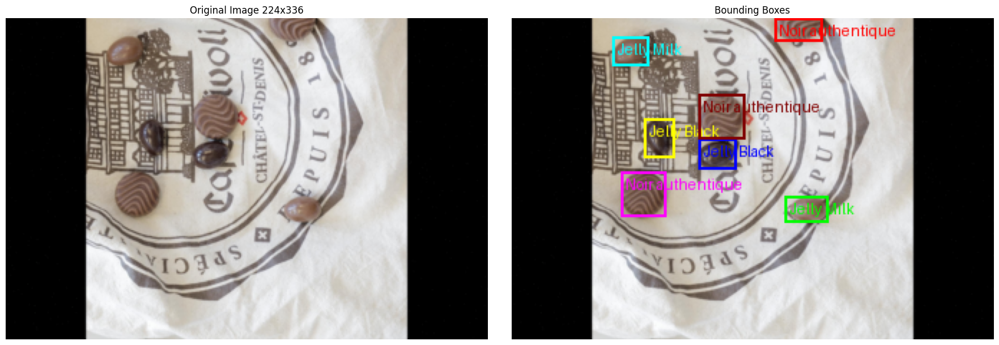

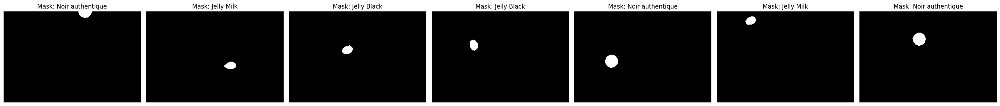

In [4]:
transform = get_segmentation_transforms(train=False)

segmentation_dataset = AugmentedChocolateSegmentationDataset(
    instances_csv='dataset_project_iapr2025/train_instances_augmented.csv',
    img_dir='dataset_project_iapr2025/train_augmented',
    mask_dir='dataset_project_iapr2025/train_masks_augmented',
    transform=transform,
    encoding='latin-1',
    verbose=False
)

visualize_segmentation_sample(segmentation_dataset)

## 3. Binary Segmentation (First Stage of the Two-Stage Pipeline)

### 3.1 Set Up Binary Segmentation Dataset and visulaize some samples

In [5]:
# First, define your transforms
train_transform = get_segmentation_transforms(train=True)
val_transform = get_segmentation_transforms(train=False)

# Create the binary segmentation dataset
binary_seg_dataset = AugmentedChocolateBinarySegmentationDataset(
    instances_csv=INSTANCES_CSV,
    img_dir=TRAIN_IMG_PATH,
    mask_dir=MASK_DIR,
    transform=val_transform,  # Using the same transform defined earlier
    encoding='latin-1',  # Add encoding parameter to handle special characters
    verbose=False
)

In [6]:
#get binary segmentation backgrounds in order to split the dataset according to the background
id_to_background = {}
for img_id, group in train_df.groupby('id'):
    id_to_background[img_id] = group['Background'].iloc[0]

binary_seg_backgrounds = get_binary_seg_backgrounds(binary_seg_dataset, id_to_background)

In [7]:
# Perform stratified split on binary segmentation dataset
binary_seg_train_indices, binary_seg_val_indices = train_test_split(
    range(len(binary_seg_dataset)),
    test_size=0.2,  # 20% for validation
    random_state=42,
    stratify=binary_seg_backgrounds
)

# Create subset datasets using these indices
binary_seg_train = Subset(binary_seg_dataset, binary_seg_train_indices)
binary_seg_val = Subset(binary_seg_dataset, binary_seg_val_indices)

# Create data loaders
binary_seg_train_loader = DataLoader(binary_seg_train, batch_size=8, shuffle=True)
binary_seg_val_loader = DataLoader(binary_seg_val, batch_size=8, shuffle=False)

# Print the number of samples in each set
print(f"\nBinary segmentation training samples: {len(binary_seg_train)}")
print(f"Binary segmentation validation samples: {len(binary_seg_val)}")


Binary segmentation training samples: 192
Binary segmentation validation samples: 48



Background distribution in binary segmentation training set:
  - White: 48 (25.0%)
  - Book: 26 (13.5%)
  - Bag: 24 (12.5%)
  - SweetsBoxVerso: 24 (12.5%)
  - SweetsBoxRecto: 24 (12.5%)
  - Plastic: 24 (12.5%)
  - StarterKit: 22 (11.5%)

Background distribution in binary segmentation validation set:
  - White: 12 (25.0%)
  - Book: 7 (14.6%)
  - Bag: 6 (12.5%)
  - SweetsBoxVerso: 6 (12.5%)
  - SweetsBoxRecto: 6 (12.5%)
  - Plastic: 6 (12.5%)
  - StarterKit: 5 (10.4%)


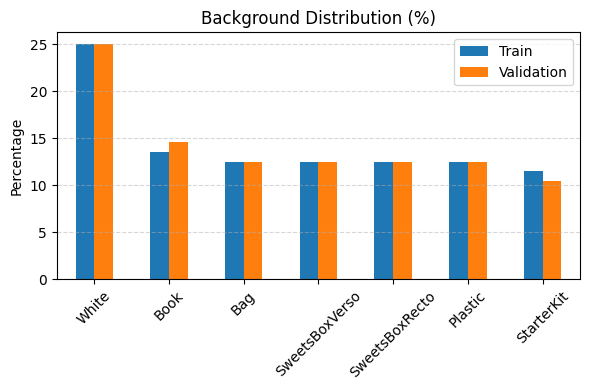

In [8]:
show_background_distribution(binary_seg_train_indices,binary_seg_val_indices, binary_seg_backgrounds)

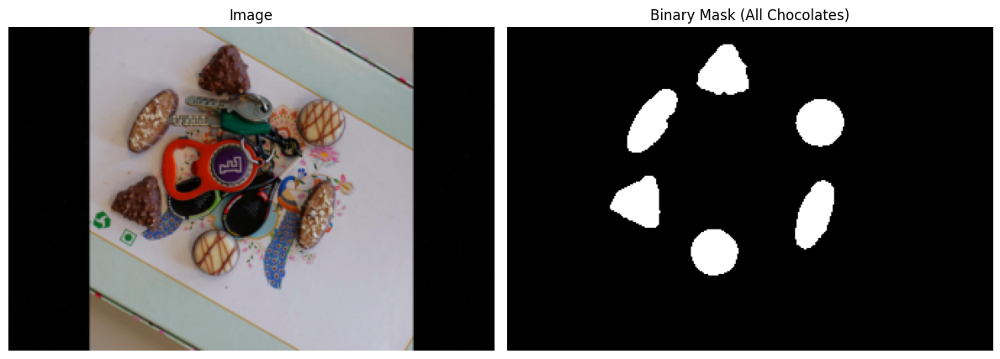

In [9]:
# Visualize a sample
visualize_binary_samples(binary_seg_dataset, num_samples=1)

### 3.2 Train the AttentionUnet Model for segmentation

In [10]:
# Create the Attention UNet model
attention_unet_model = AttentionUNet(n_channels=3, n_classes=1, base_filters=32).to(device)
print(f"Model parameters: {attention_unet_model.count_parameters():,}")

#LOAD MODEL PARAMETERS
checkpoint = torch.load('src/checkpoints/attention_unet_model3.pth',
                       map_location=device,
                       weights_only=False)

attention_unet_model.load_state_dict(checkpoint['model_state_dict'])

#load history from checkpoint
history_attention = checkpoint['history']

criterion = BCEDiceLoss(dice_weight=1.5, bce_weight=1.0)  #Emphasize Dice component
optimizer = torch.optim.AdamW(attention_unet_model.parameters(), lr=0.0005, weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, min_lr=1e-6)

Model parameters: 8,030,477


In [11]:
# history_attention = train_segmentation_model(
#     model=attention_unet_model,
#     train_loader=binary_seg_train_loader,
#     val_loader=binary_seg_val_loader,
#     criterion=criterion,
#     optimizer=optimizer,
#     scheduler=scheduler,
#     device=device,
#     num_epochs=70,
#     patience=7,
#     checkpoint_path='src/checkpoints/attention_unet_model3.pth',
#     is_cosine_scheduler=False
# )

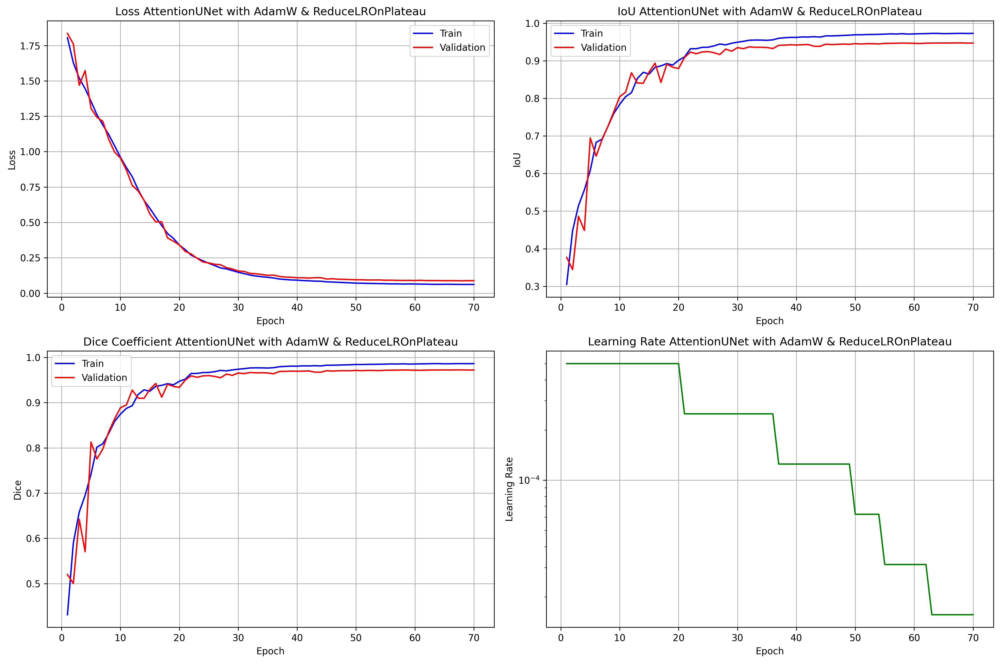

In [12]:
Image(filename='segmentation_training_plot.png')

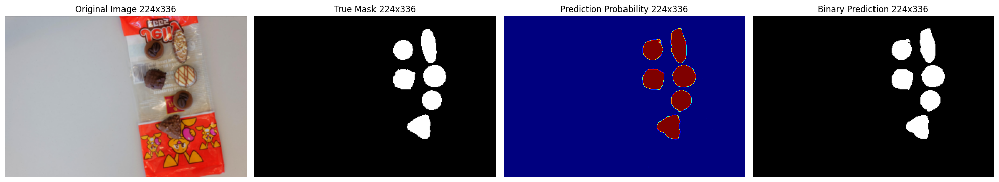

In [13]:
visualize_predictions(attention_unet_model, binary_seg_val, device, num_samples=1)

### 3.3 Go through the entire Segmentation pipeline and see extracted chocolat Regions

Watershed found 4 chocolate components
Extracted 4 chocolate regions


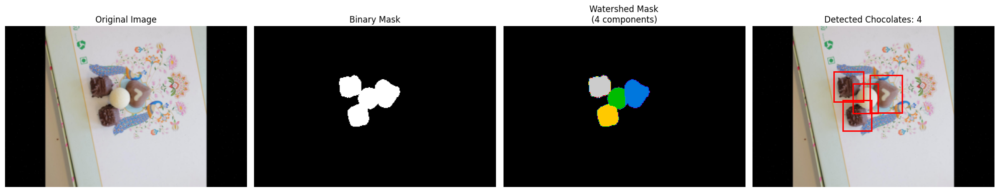

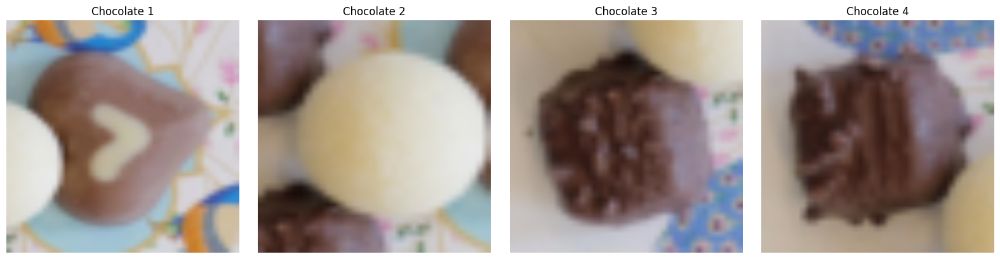

In [14]:
# Example usage with reduced min_size:
sample_idx = 1  # Choose a sample index
image, _ = binary_seg_val[sample_idx]

# Process with tighter crops
process_and_visualize_with_watershed(
    image=image,
    segmentation_model=attention_unet_model,
    device=device,
    min_distance=10,
    min_size=300,  # Reduced from 300 to detect smaller chocolates
    crop_padding=3  # Small padding for very tight crops
)

## 4. Feature Extraction for Classification (Second Stage of the Two-Stage Pipeline)

### 4.1 Visualize the extracted training dataset for Feature Extraction

In [15]:
#Create a correctly labeled dataset
extracted_regions, correct_labels, region_images, source_image_ids = create_aligned_training_data(
    segmentation_model=attention_unet_model,
    device=device
)

Processing images: 100%|██████████| 240/240 [00:53<00:00,  4.47it/s]

Created dataset with 1542 correctly labeled regions

Label distribution:
  - Comtesse: 162 (10.5%)
  - Passion au lait: 133 (8.6%)
  - Arabia: 130 (8.4%)
  - Tentation noir: 130 (8.4%)
  - Noir authentique: 124 (8.0%)
  - Stracciatella: 122 (7.9%)
  - Triangolo: 117 (7.6%)
  - Noblesse: 116 (7.5%)
  - Creme brulee: 112 (7.3%)
  - Jelly White: 108 (7.0%)
  - Amandina: 100 (6.5%)
  - Jelly Black: 96 (6.2%)
  - Jelly Milk: 92 (6.0%)


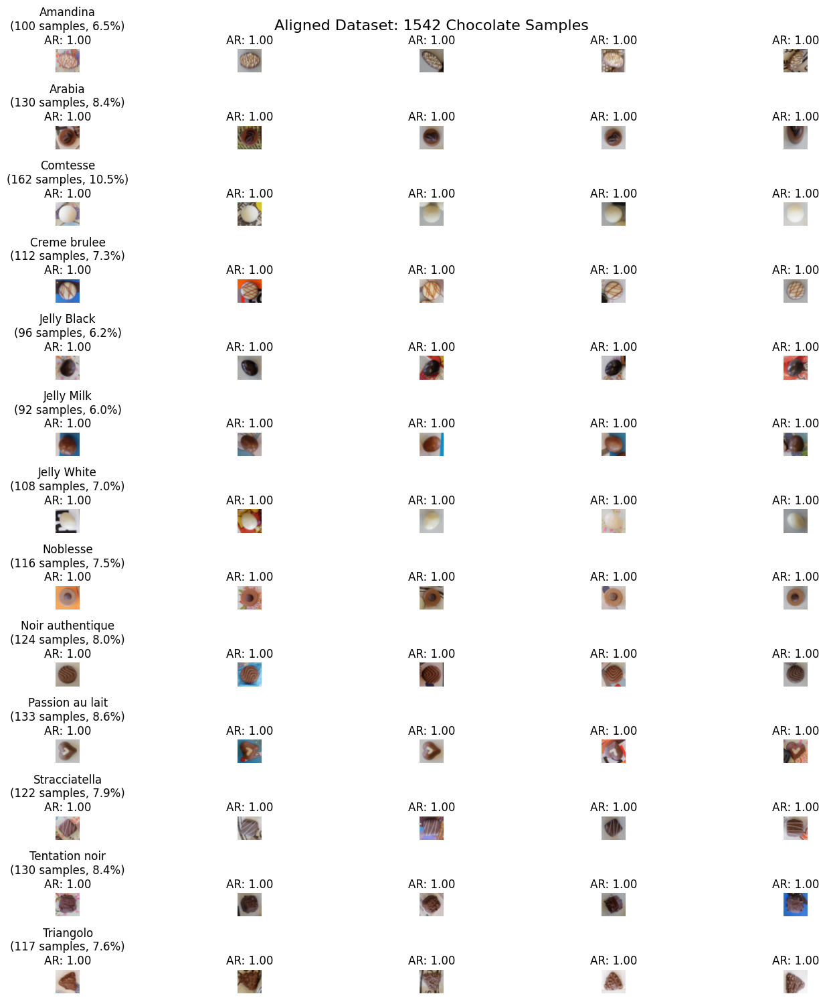

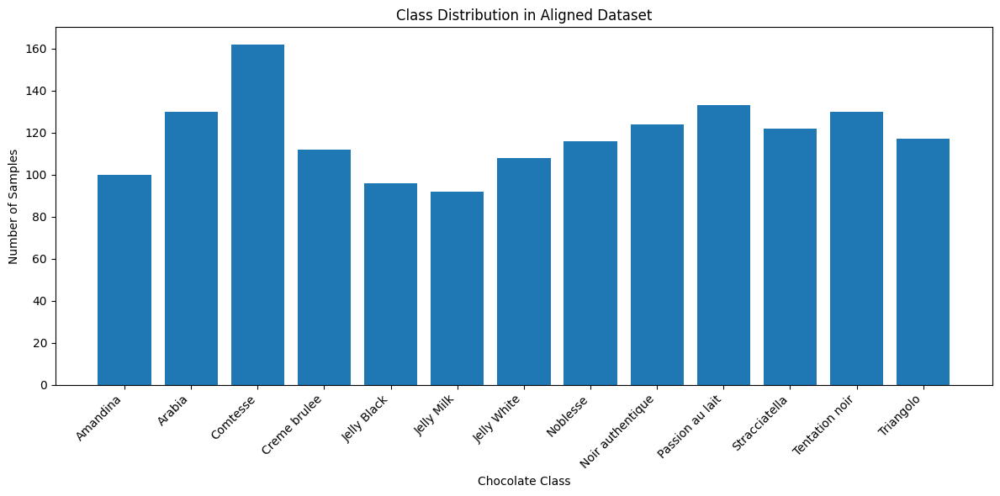

Total samples: 1542

Class distribution:
  - Amandina: 100 samples (6.5%)
  - Arabia: 130 samples (8.4%)
  - Comtesse: 162 samples (10.5%)
  - Creme brulee: 112 samples (7.3%)
  - Jelly Black: 96 samples (6.2%)
  - Jelly Milk: 92 samples (6.0%)
  - Jelly White: 108 samples (7.0%)
  - Noblesse: 116 samples (7.5%)
  - Noir authentique: 124 samples (8.0%)
  - Passion au lait: 133 samples (8.6%)
  - Stracciatella: 122 samples (7.9%)
  - Tentation noir: 130 samples (8.4%)
  - Triangolo: 117 samples (7.6%)


In [16]:
# Visualize the dataset that will go into the feature extractor model
visualize_aligned_dataset(
    region_images=region_images,
    correct_labels=correct_labels,
    samples_per_class=5,  # Show 5 samples per class
    figsize=(15, 15),
    seed=42  # For reproducibility
)

### 4.2 Prepare Dataset and Dataloaders and Visualize

In [17]:
# Get unique class names
class_names = sorted(set(correct_labels))
print(f"Training on {len(region_images)} samples with {len(class_names)} classes")

# Create dataset splits with stratification
train_regions, val_regions, train_labels, val_labels = train_test_split(
    region_images, correct_labels, test_size=0.2, random_state=42, stratify=correct_labels
)

print(f"  - Training samples: {len(train_regions)}")
print(f"  - Validation samples: {len(val_regions)}")

Training on 1542 samples with 13 classes
  - Training samples: 1233
  - Validation samples: 309


In [18]:
# Create datasets
train_dataset = ChocolateFeatureDataset(
    train_regions, train_labels, class_names,
    transform=get_robust_feature_transforms(train=True)
)

val_dataset = ChocolateFeatureDataset(
    val_regions, val_labels, class_names,
    transform=get_robust_feature_transforms(train=False)
)

# Create data loaders
train_loader_feature = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader_feature = DataLoader(val_dataset, batch_size=309, shuffle=False)

Visualizing Training Samples:


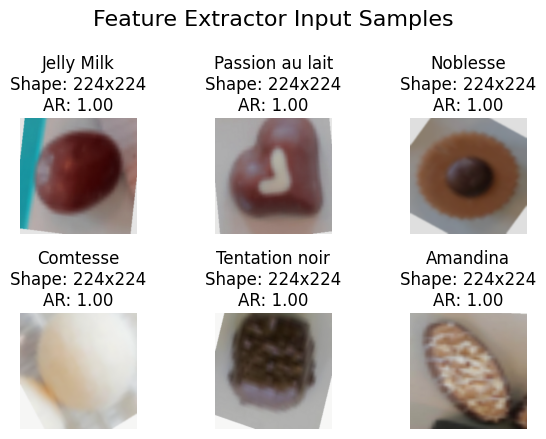

Batch shape: torch.Size([32, 3, 224, 224])

Visualizing Validation Samples:


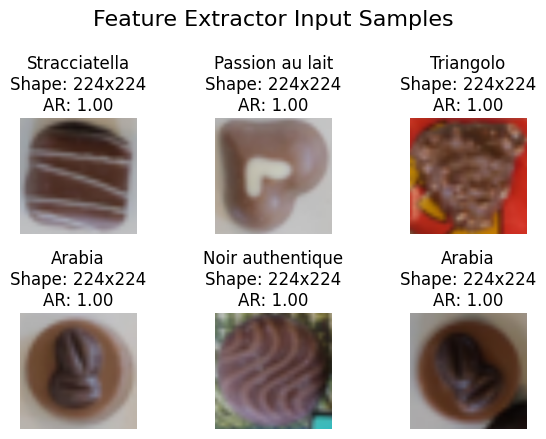

Batch shape: torch.Size([309, 3, 224, 224])


In [19]:
# Get a batch and visualize
print("Visualizing Training Samples:")
visualize_feature_extractor_batch(train_loader_feature, class_names, num_images=6)

print("\nVisualizing Validation Samples:")
visualize_feature_extractor_batch(val_loader_feature, class_names, num_images=6)

### 4.3 Train the FeatureExtractor Model for classification

In [20]:
# Initialize the feature extractor model
feature_extractor = FeatureExtractor(num_classes=len(class_names), class_names=class_names).to(device)
print(f"Model parameters: {feature_extractor.count_parameters():,}")

#load the pretrained model
feature_extractor.load_state_dict(torch.load('src/checkpoints/feature_extractor_best_f1.pth', weights_only=False, map_location=device))

Model parameters: 1,715,981


<All keys matched successfully>

In [21]:
criterion = LabelSmoothingLoss(classes=len(class_names), smoothing=0.1)
optimizer = AdamW(
    feature_extractor.parameters(),
    lr=0.0001,
    betas=(0.9, 0.999),  # Default momentum parameters
    eps=1e-8,  # Numerical stability
    weight_decay=0.01  # L2 regularization factor
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=150,
    eta_min=1e-7  
)

In [22]:
# # Train the model
# feature_extractor, history, best_f1 = train_feature_model(
#     model=feature_extractor,
#     train_loader=train_loader_feature,
#     val_loader=val_loader_feature,
#     criterion=criterion,
#     optimizer=optimizer,
#     scheduler=scheduler,
#     device=device,
#     class_names=class_names,
#     num_epochs=150,
#     save_dir='src/checkpoints',
#     early_stopping_patience=15,
#     is_cosine_scheduler=True
# )

# print(f"Training complete! Best validation F1 score: {best_f1:.4f}")

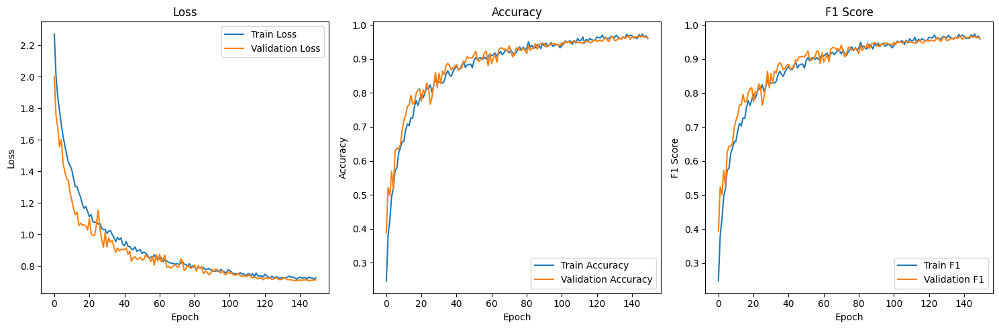

In [23]:
Image(filename='feature_extraction_training_plot.png')

## 5. Complete End-to-End Inference Pipeline

### 5.1 Test the pipeline on a validation image

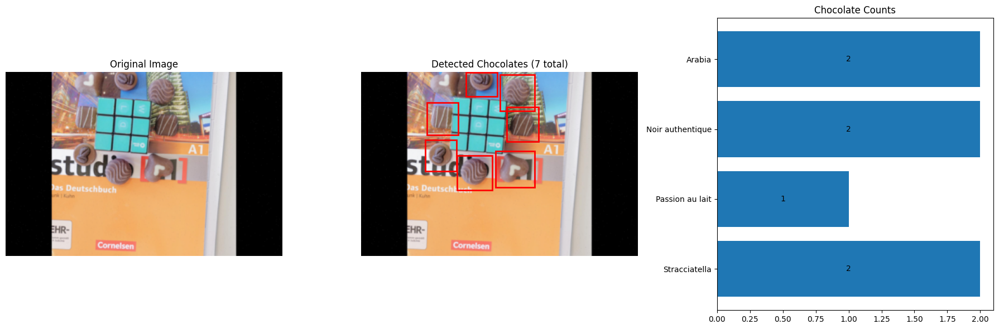

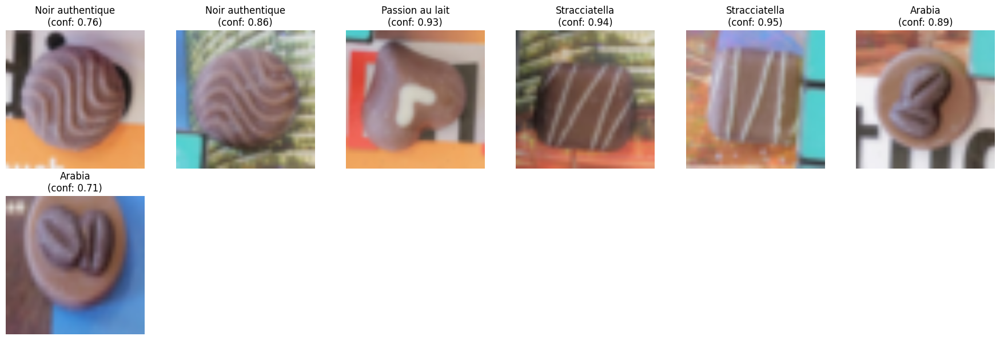


Chocolate Counts:
  - Arabia: 2
  - Noir authentique: 2
  - Passion au lait: 1
  - Stracciatella: 2
Total: 7


In [26]:
for i in range(1): 
   # Test the pipeline on a validation image
    val_img_idx = i  # Choose a good validation image
    test_img, _ = binary_seg_val[val_img_idx]

    # Run the pipeline
    test_counts, test_vis_data = chocolate_detection_pipeline(
        image_tensor=test_img,
        segmentation_model=attention_unet_model,
        feature_model=feature_extractor,
        class_names=class_names,
        device=device
    )

    # Visualize the results
    visualize_pipeline_results(test_img, test_counts, test_vis_data)

### 5.2 Do the same, but visualize the segmentation output and probabilites of assigned chocolates

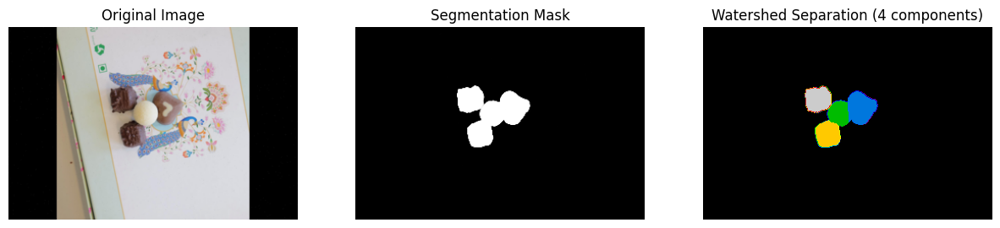

Extracted 4 regions


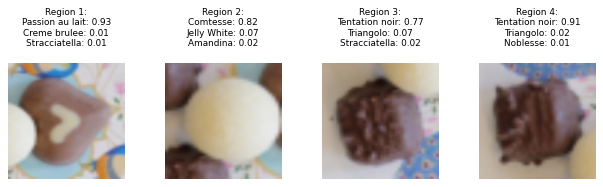

In [26]:
# 1. Visualize segmentation output
with torch.no_grad():
    image_batch = test_img.unsqueeze(0).to(device)
    seg_output = attention_unet_model(image_batch)
    seg_mask = torch.sigmoid(seg_output).squeeze().cpu().numpy()

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(inverse_transform(test_img))
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(seg_mask, cmap='gray')
    plt.title("Segmentation Mask")
    plt.axis('off')

    # 2. Visualize watershed separation
    watershed_labels = separate_chocolates_watershed(
        mask=seg_mask,
        min_distance=10,
        min_size=300
    )

    plt.subplot(1, 3, 3)
    plt.imshow(watershed_labels, cmap='nipy_spectral')
    plt.title(f"Watershed Separation ({watershed_labels.max()} components)")
    plt.axis('off')
    plt.show()

# 3. Extract regions and test classifier directly
regions = extract_chocolate_regions_improved(
    image=test_img,
    segmentation_model=attention_unet_model,
    device=device,
    min_distance=10,
    min_size=300
)

print(f"Extracted {len(regions)} regions")

if len(regions) > 0:
    # Test classifier on each region
    feature_extractor.eval()
    
    # Reduce overall figure size (width=8, height=3 * number of rows)
    num_rows = (len(regions) + 2) // 3
    plt.figure(figsize=(8, 2 * num_rows), dpi=80)  # You can also reduce dpi for even smaller appearance

    for i, region in enumerate(regions):
        with torch.no_grad():
            region_img = region['image'].unsqueeze(0).to(device)
            outputs, _ = feature_extractor(region_img)
            probs = F.softmax(outputs, dim=1)

            # Get top 3 predictions
            top_probs, top_indices = torch.topk(probs, 3)
            top_probs = top_probs.squeeze().cpu().numpy()
            top_indices = top_indices.squeeze().cpu().numpy()

            # Display image and predictions
            plt.subplot(num_rows, 4, i + 1)
            plt.imshow(inverse_transform(region['image']))

            title = f"Region {i+1}:\n"
            for j in range(3):
                class_idx = top_indices[j]
                class_name = class_names[class_idx]
                prob = top_probs[j]
                title += f"{class_name}: {prob:.2f}\n"

            plt.title(title, fontsize=8)
            plt.axis('off')

    plt.tight_layout()
    plt.show()


## 6. Inference on Test Data and Submission

### 6.1 Run Inference on Test Set

In [31]:
from tqdm import tqdm
def run_test_inference(test_dataset, segmentation_model, feature_model, class_names, device, show_visualizations=True):
    """
    Run inference on test dataset

    Args:
        test_dataset: Test dataset
        segmentation_model: Binary segmentation model
        feature_model: Feature extraction and classification model
        class_names: List of chocolate class names
        device: Device to run inference on
        show_visualizations: Whether to show visualization plots (default: True)

    Returns:
        Dictionary with results for each image
    """

    from src.utils import visualize_pipeline_results

    # Set models to evaluation mode
    segmentation_model.eval()
    feature_model.eval()

    test_results = {}

    print(f"Running inference on {len(test_dataset)} test images...")

    for idx in tqdm(range(len(test_dataset))):
        # Get test image and ID
        image, img_id = test_dataset[idx]

        # Run the pipeline
        counts, vis_data = chocolate_detection_pipeline(
            image_tensor=image,
            segmentation_model=segmentation_model,
            feature_model=feature_model,
            class_names=class_names,
            device=device
        )

        # Store results
        test_results[img_id] = {
            'counts': counts,
            'num_detected': len(vis_data['regions']),
            'vis_data': vis_data
        }

        # Optional: Visualize some examples (e.g. every 36th)
        if show_visualizations and idx % 10 == 0:  # Added check for show_visualizations
            visualize_pipeline_results(image, counts, vis_data)

    print(f"Completed inference on {len(test_results)} test images")
    return test_results

Running inference on 180 test images...


  0%|          | 0/180 [00:00<?, ?it/s]

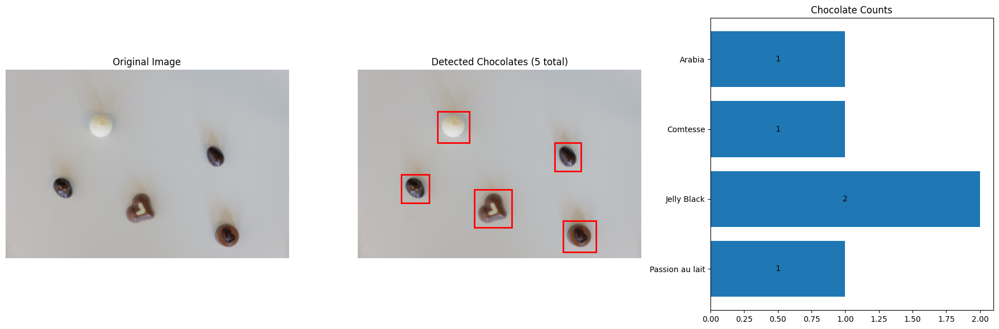

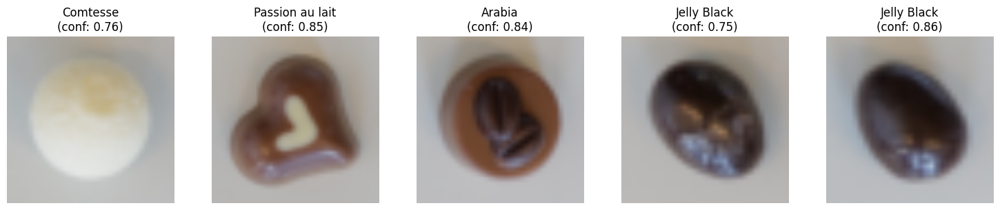

  1%|          | 1/180 [00:02<06:51,  2.30s/it]


Chocolate Counts:
  - Arabia: 1
  - Comtesse: 1
  - Jelly Black: 2
  - Passion au lait: 1
Total: 5


  6%|▌         | 10/180 [00:11<02:01,  1.40it/s]

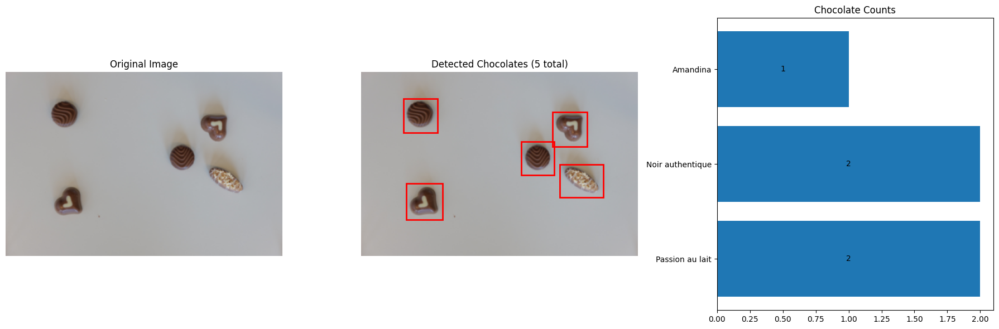

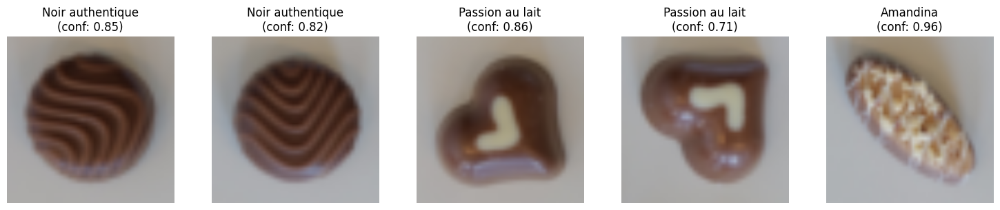

  6%|▌         | 11/180 [00:12<02:07,  1.32it/s]


Chocolate Counts:
  - Amandina: 1
  - Noir authentique: 2
  - Passion au lait: 2
Total: 5


 11%|█         | 20/180 [00:15<01:11,  2.25it/s]

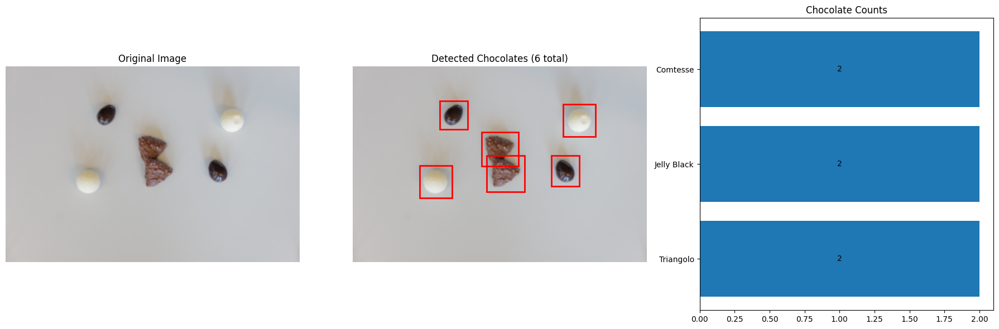

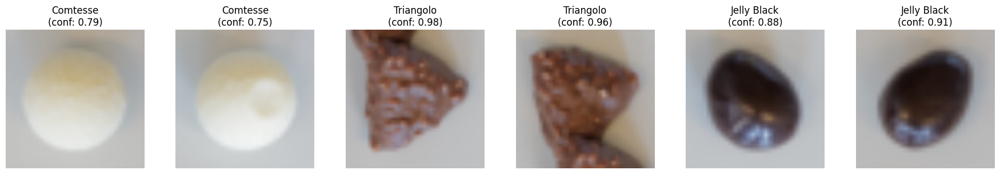

 12%|█▏        | 21/180 [00:16<01:31,  1.75it/s]


Chocolate Counts:
  - Comtesse: 2
  - Jelly Black: 2
  - Triangolo: 2
Total: 6


 17%|█▋        | 30/180 [00:20<01:04,  2.33it/s]

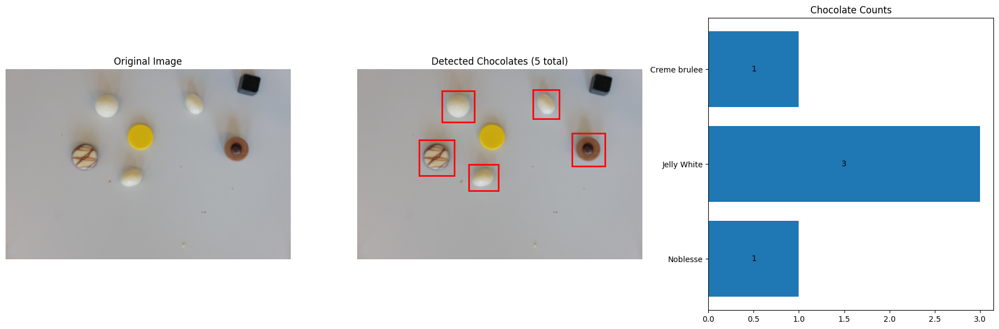

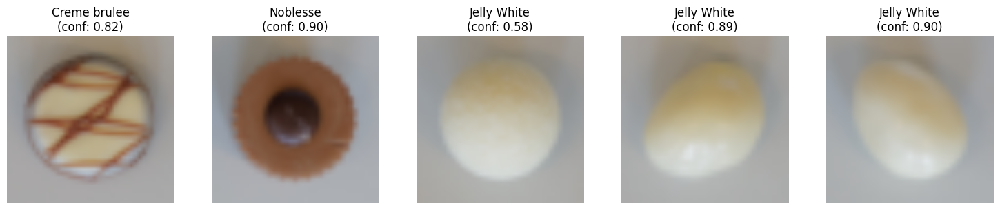

 17%|█▋        | 31/180 [00:21<01:21,  1.83it/s]


Chocolate Counts:
  - Creme brulee: 1
  - Jelly White: 3
  - Noblesse: 1
Total: 5


 22%|██▏       | 40/180 [00:25<01:04,  2.17it/s]

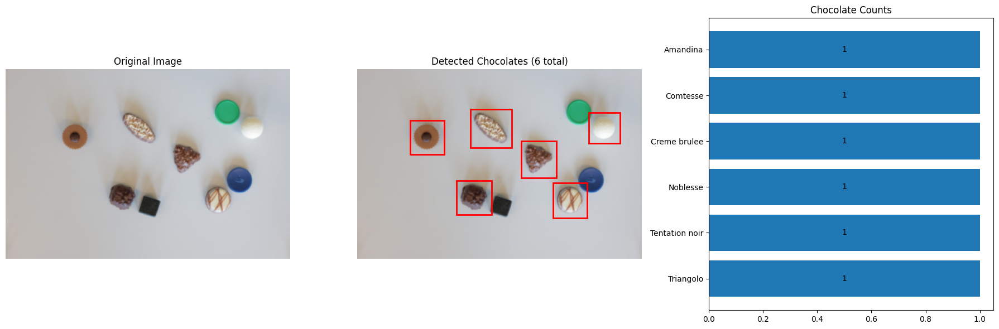

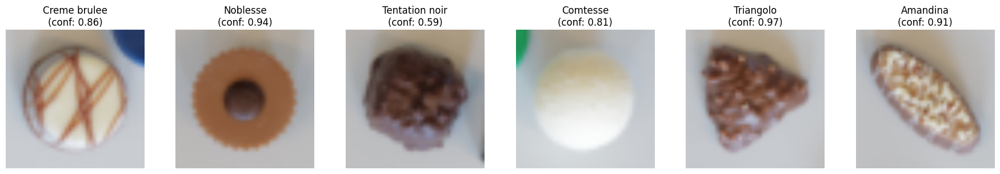

 23%|██▎       | 41/180 [00:26<01:21,  1.70it/s]


Chocolate Counts:
  - Amandina: 1
  - Comtesse: 1
  - Creme brulee: 1
  - Noblesse: 1
  - Tentation noir: 1
  - Triangolo: 1
Total: 6


 28%|██▊       | 50/180 [00:30<00:57,  2.27it/s]

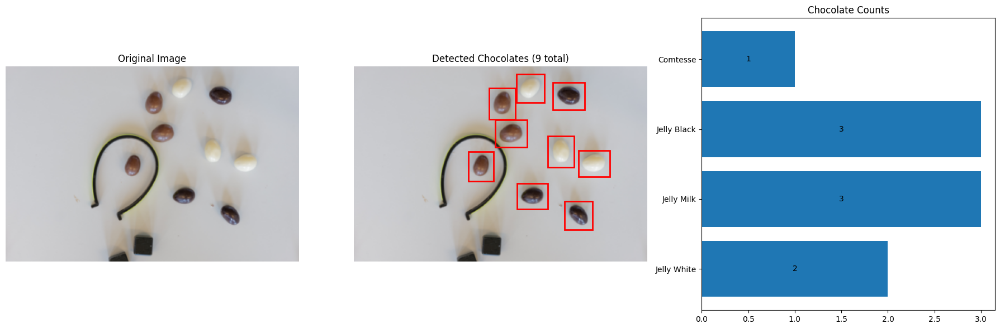

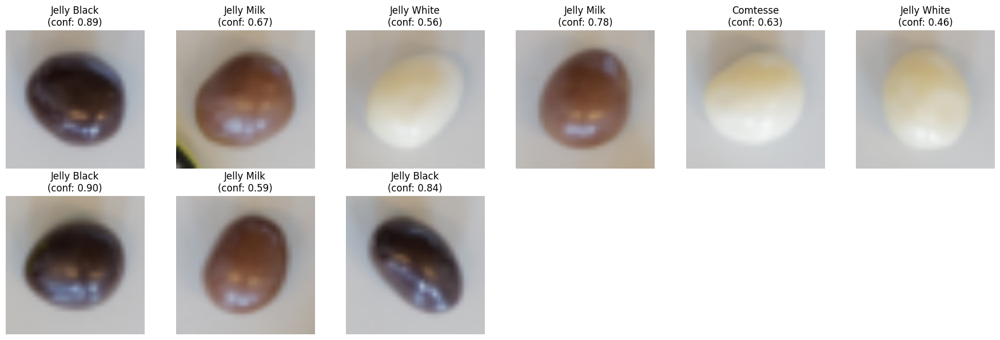

 28%|██▊       | 51/180 [00:31<01:25,  1.50it/s]


Chocolate Counts:
  - Comtesse: 1
  - Jelly Black: 3
  - Jelly Milk: 3
  - Jelly White: 2
Total: 9


 33%|███▎      | 60/180 [00:35<00:50,  2.36it/s]

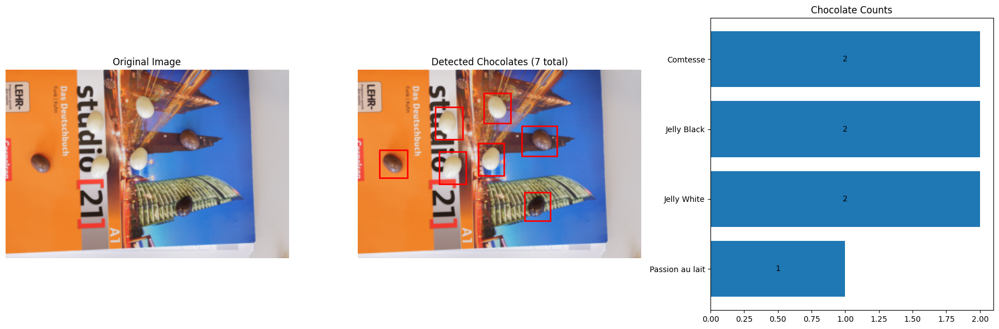

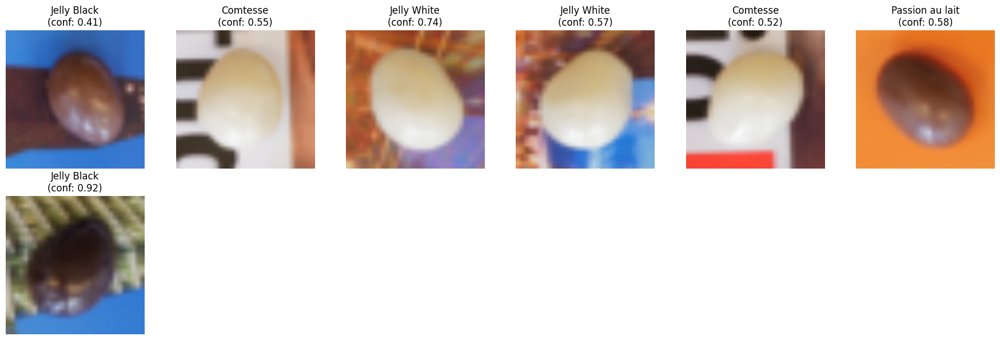

 34%|███▍      | 61/180 [00:36<01:09,  1.70it/s]


Chocolate Counts:
  - Comtesse: 2
  - Jelly Black: 2
  - Jelly White: 2
  - Passion au lait: 1
Total: 7


 39%|███▉      | 70/180 [00:40<00:48,  2.28it/s]

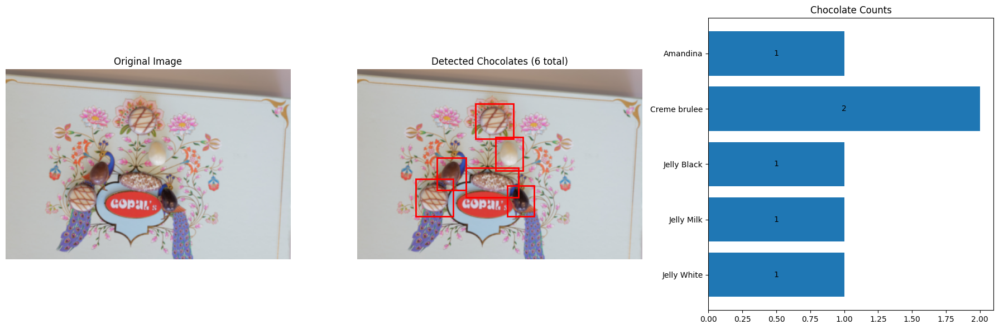

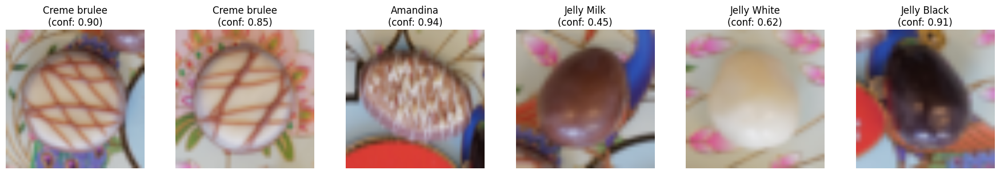

 39%|███▉      | 71/180 [00:41<01:03,  1.70it/s]


Chocolate Counts:
  - Amandina: 1
  - Creme brulee: 2
  - Jelly Black: 1
  - Jelly Milk: 1
  - Jelly White: 1
Total: 6


 44%|████▍     | 80/180 [00:45<00:45,  2.18it/s]

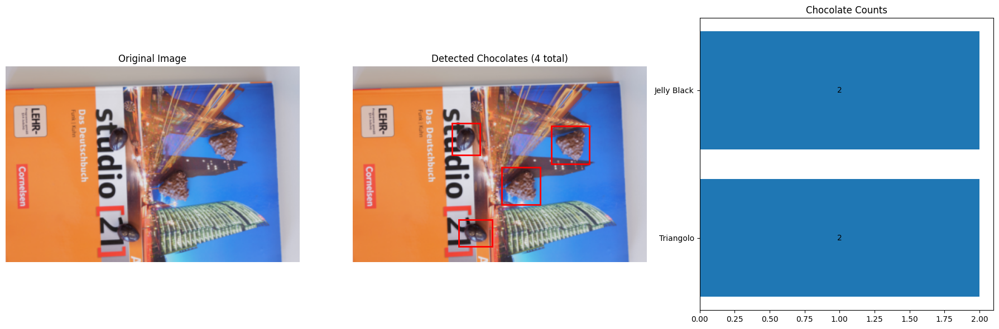

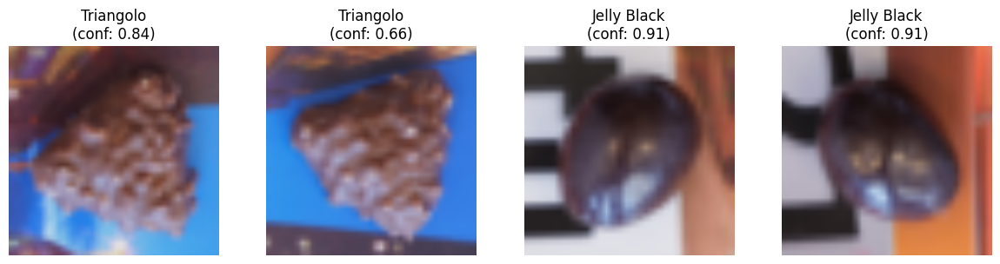

 45%|████▌     | 81/180 [00:46<00:55,  1.78it/s]


Chocolate Counts:
  - Jelly Black: 2
  - Triangolo: 2
Total: 4


 50%|█████     | 90/180 [00:50<00:39,  2.30it/s]

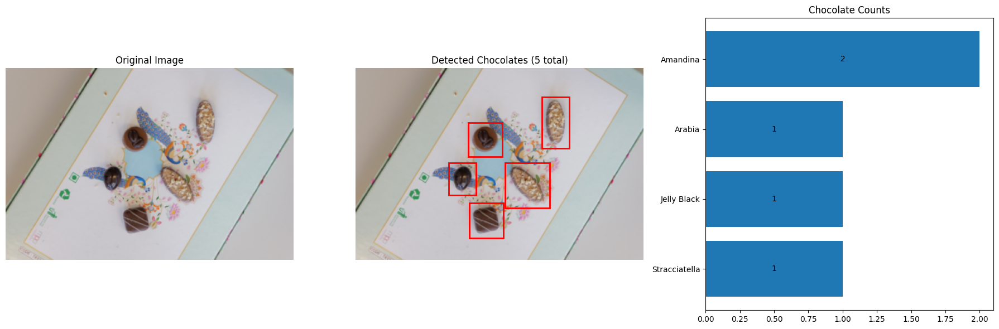

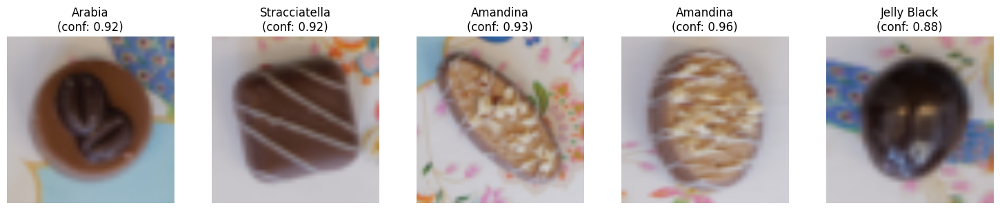

 51%|█████     | 91/180 [00:50<00:49,  1.80it/s]


Chocolate Counts:
  - Amandina: 2
  - Arabia: 1
  - Jelly Black: 1
  - Stracciatella: 1
Total: 5


 56%|█████▌    | 100/180 [00:54<00:34,  2.33it/s]

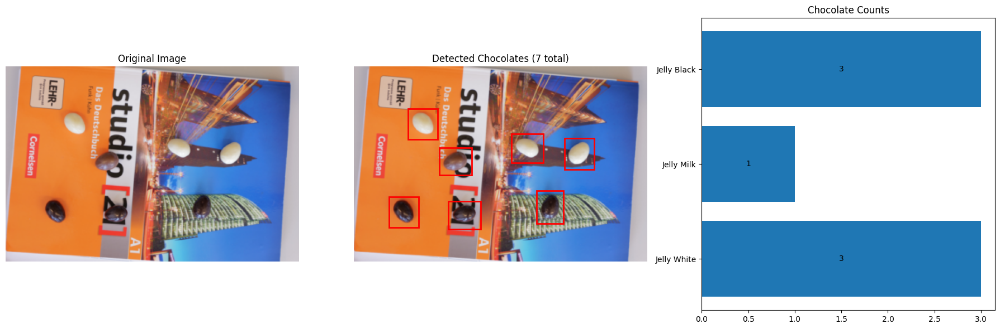

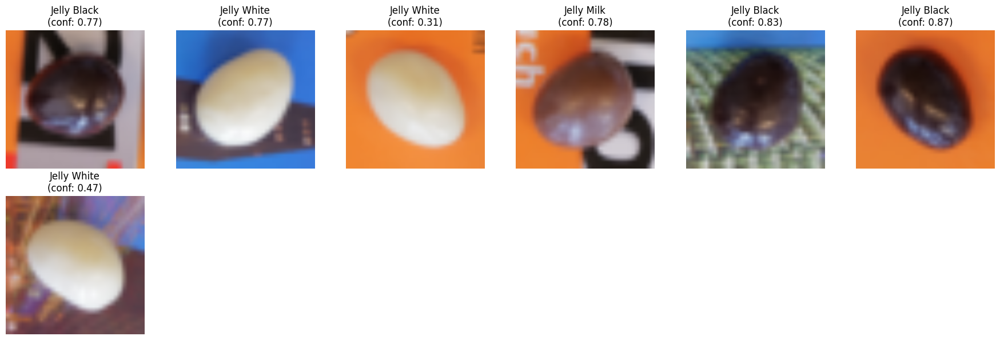

 56%|█████▌    | 101/180 [00:55<00:50,  1.57it/s]


Chocolate Counts:
  - Jelly Black: 3
  - Jelly Milk: 1
  - Jelly White: 3
Total: 7


 61%|██████    | 110/180 [00:59<00:33,  2.12it/s]

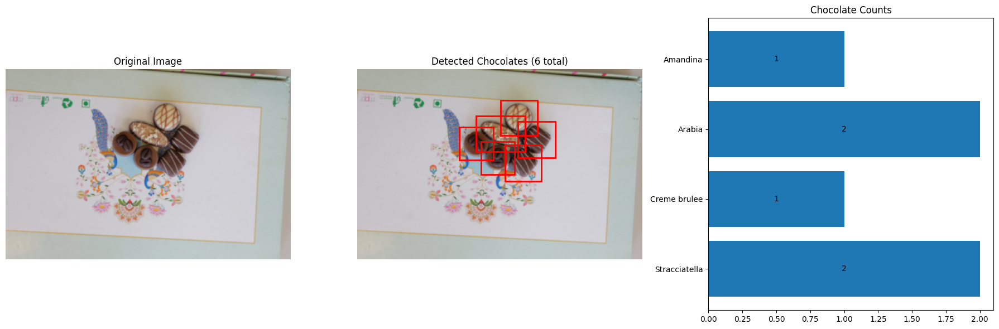

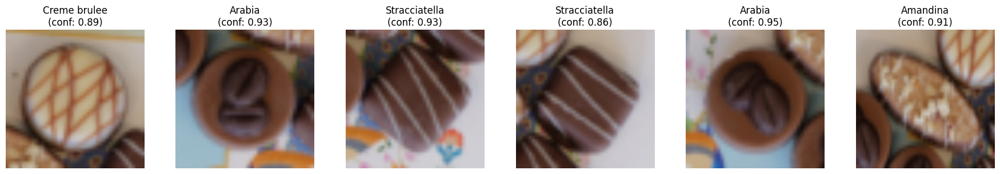

 62%|██████▏   | 111/180 [01:00<00:42,  1.64it/s]


Chocolate Counts:
  - Amandina: 1
  - Arabia: 2
  - Creme brulee: 1
  - Stracciatella: 2
Total: 6


 67%|██████▋   | 120/180 [01:04<00:26,  2.28it/s]

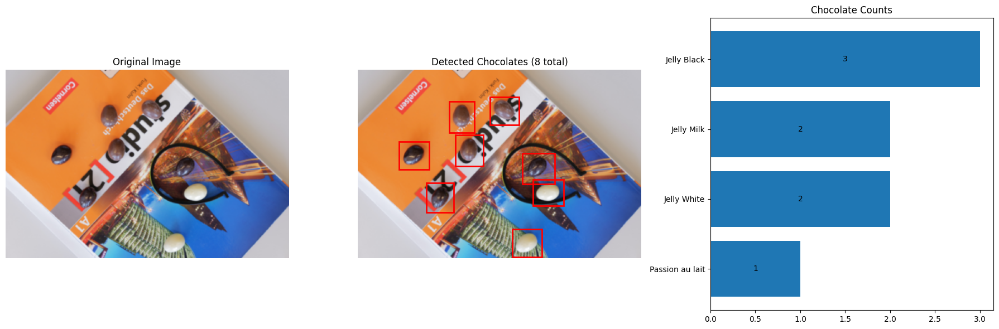

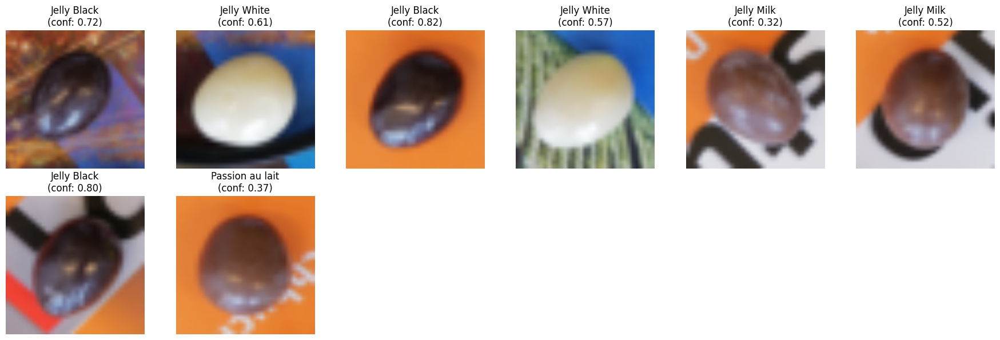

 67%|██████▋   | 121/180 [01:06<00:37,  1.58it/s]


Chocolate Counts:
  - Jelly Black: 3
  - Jelly Milk: 2
  - Jelly White: 2
  - Passion au lait: 1
Total: 8


 72%|███████▏  | 130/180 [01:10<00:23,  2.16it/s]

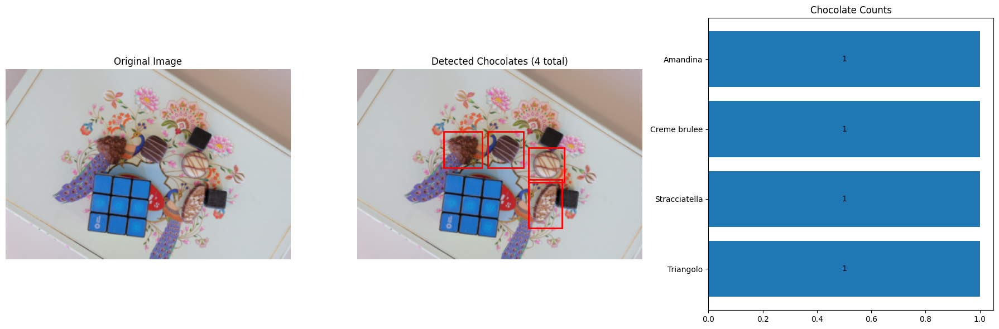

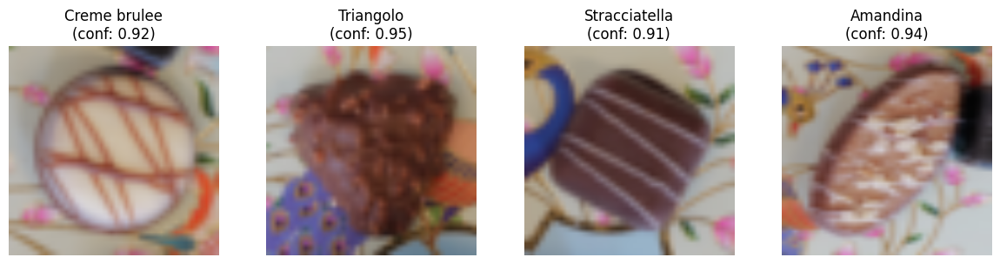

 73%|███████▎  | 131/180 [01:11<00:28,  1.75it/s]


Chocolate Counts:
  - Amandina: 1
  - Creme brulee: 1
  - Stracciatella: 1
  - Triangolo: 1
Total: 4


 78%|███████▊  | 140/180 [01:15<00:18,  2.20it/s]

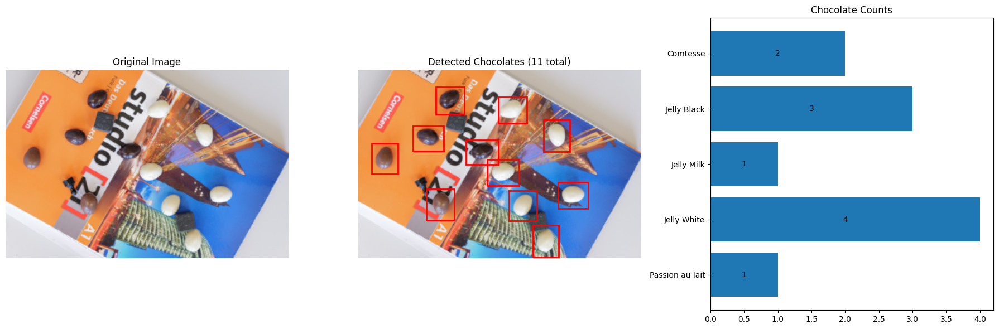

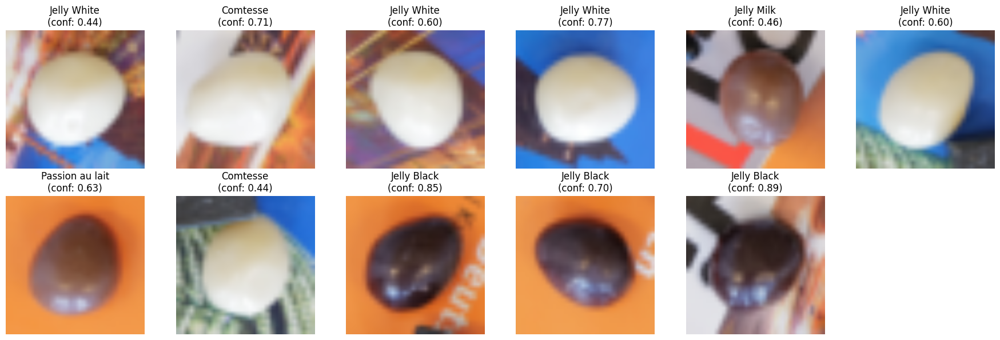

 78%|███████▊  | 141/180 [01:16<00:27,  1.42it/s]


Chocolate Counts:
  - Comtesse: 2
  - Jelly Black: 3
  - Jelly Milk: 1
  - Jelly White: 4
  - Passion au lait: 1
Total: 11


 83%|████████▎ | 150/180 [01:20<00:14,  2.07it/s]

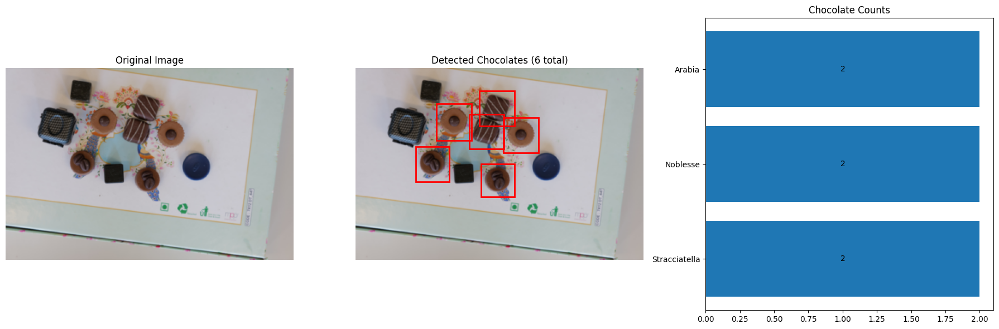

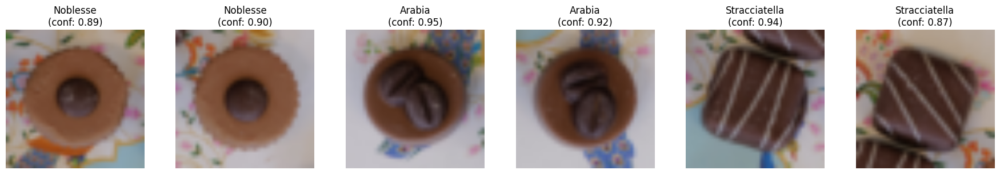

 84%|████████▍ | 151/180 [01:21<00:19,  1.47it/s]


Chocolate Counts:
  - Arabia: 2
  - Noblesse: 2
  - Stracciatella: 2
Total: 6


 89%|████████▉ | 160/180 [01:26<00:11,  1.67it/s]

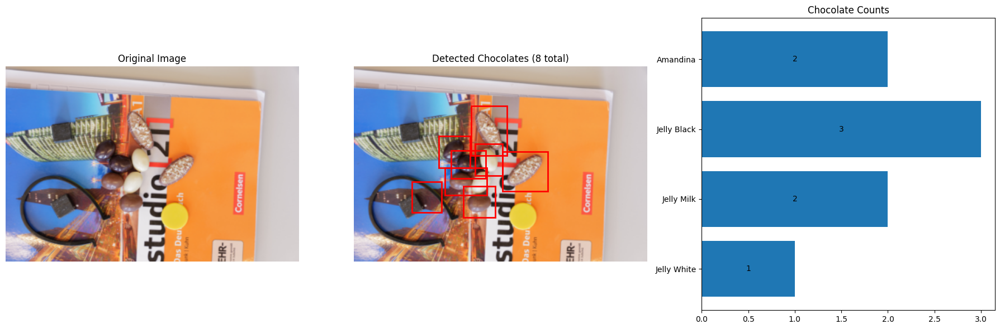

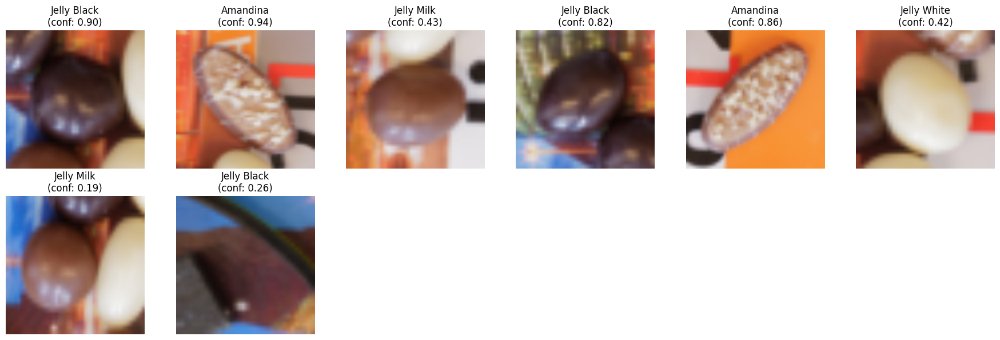

 89%|████████▉ | 161/180 [01:27<00:14,  1.30it/s]


Chocolate Counts:
  - Amandina: 2
  - Jelly Black: 3
  - Jelly Milk: 2
  - Jelly White: 1
Total: 8


 94%|█████████▍| 170/180 [01:32<00:05,  1.84it/s]

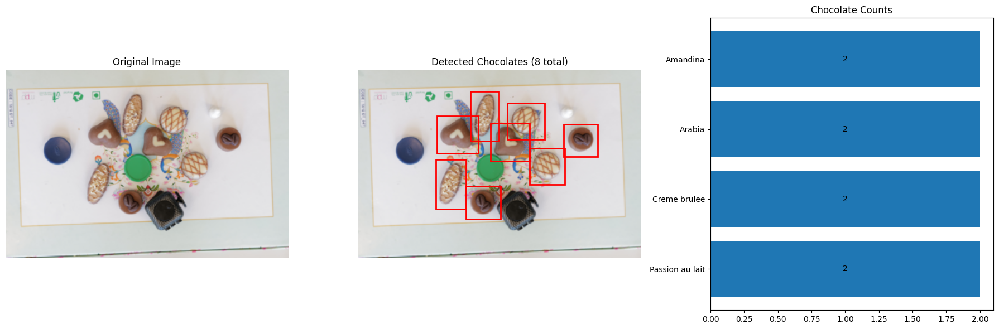

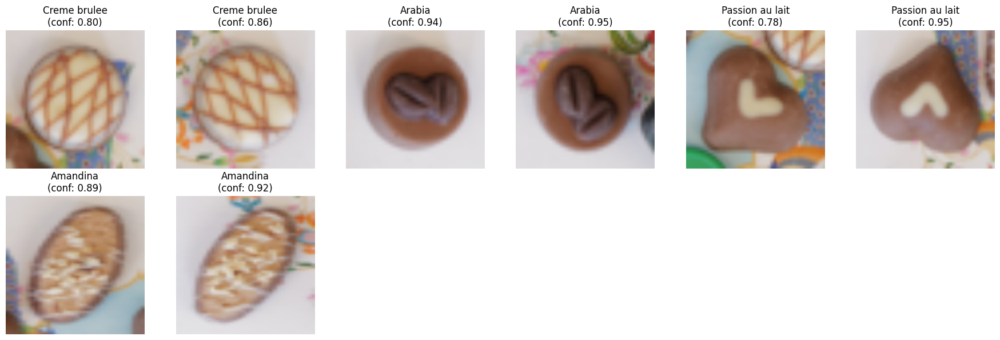

 95%|█████████▌| 171/180 [01:33<00:06,  1.35it/s]


Chocolate Counts:
  - Amandina: 2
  - Arabia: 2
  - Creme brulee: 2
  - Passion au lait: 2
Total: 8


100%|██████████| 180/180 [01:38<00:00,  1.83it/s]

Completed inference on 180 test images


In [32]:
test_dataset = ChocolateTestDataset(TEST_IMG_PATH, transform=val_transform)

# Run inference on test set
test_results = run_test_inference(
    test_dataset=test_dataset,
    segmentation_model=attention_unet_model,
    feature_model=feature_extractor,
    class_names=class_names,
    device=device,
    show_visualizations=True
)

### 6.2 Verify Submission Format

In [29]:
# Convert results to submission format
submission_df = convert_to_submission_format(test_results, class_names)

# Verify column names match sample submission
sample_submission = pd.read_csv('dataset_project_iapr2025/sample_submission.csv')
print("\nVerifying column names:")
print(f"Sample submission columns: {list(sample_submission.columns)}")
print(f"Our submission columns: {list(submission_df.columns)}")

print(f"\n✅ Final submission has {len(submission_df)} rows with {len(class_names)} chocolate classes")


Verifying column names:
Sample submission columns: ['id', 'Jelly White', 'Jelly Milk', 'Jelly Black', 'Amandina', 'Crème brulée', 'Triangolo', 'Tentation noir', 'Comtesse', 'Noblesse', 'Noir authentique', 'Passion au lait', 'Arabia', 'Stracciatella']
Our submission columns: ['id', 'Jelly White', 'Jelly Milk', 'Jelly Black', 'Amandina', 'Crème brulée', 'Triangolo', 'Tentation noir', 'Comtesse', 'Noblesse', 'Noir authentique', 'Passion au lait', 'Arabia', 'Stracciatella']

✅ Final submission has 180 rows with 13 chocolate classes


### 6.3 Save Submission File

In [30]:
# Save submission
save_submission_file(submission_df, 'submission_group2.csv')

# Verify submission using provided check.py
try:
    import subprocess
    result = subprocess.run(['python', 'check.py', 'check', '--path=submission.csv'],
                           capture_output=True, text=True)
    print("\nSubmission validation result:")
    print(result.stdout)
    if result.stderr:
        print("Errors:")
        print(result.stderr)
except Exception as e:
    print(f"Could not run validation script: {e}")
    print("Please validate manually using 'python check.py check --path=submission.csv'")

Saved submission to submission_group2.csv
Verified file can be read successfully
  - File size: 6.31 KB
  - Row count: 180

Submission validation result:
OK

